# Introductory notebook

In this notebook we will compare linear regression with XGBoost in forecasting weakly stationary data. We will also show the impact of hyperparameter tuning XGBoost, and we will compare the computational complexity of Bayesian that's either naive or warmstarted. This notebook serves as an introductory explanation of the experiment setting of my thesis. The notebook is structured as follows:
1. Dataset - loading, showing, and dividing data in training and test set
2. XGBoost & linear regression - train, predict, show, compare
3. Hyperoptimization XGBoost with Bayesian optimization
4. Experiment definition
5. Warmstarted Bayesian optimization

In [1]:
# imports
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from hyperopt import hp, tpe, fmin,  STATUS_OK, rand, Trials
from hyperopt.fmin import generate_trials_to_calculate as warmstart
import xgboost as xgb
py.init_notebook_mode(connected=True)

# 1. Dataset

In [2]:
# load and clean data
df_all = pd.read_csv('../../data/timeseries/raw/final_data.csv', index_col=0)
df_all = df_all.rename(columns={'COAST_target_diff': 'endogenous', 'COAST_temp_diff': 'exogenous'})
df_all.index = pd.DatetimeIndex(df_all.index)

# select endogenous + exogenous + time based features. Note that lagged features are not used.
df = df_all[['endogenous','exogenous','Hour of Day','Day of Week','Day of Year','Holiday']].dropna().iloc[:365*24*2]

# divide into exogenous/endogenous and training/test data
exogenous_df, endogenous_df = df.iloc[:,1:],df.iloc[:,0]
data_dmatrix = xgb.DMatrix(data=exogenous_df,label=pd.DataFrame(data=endogenous_df, index=endogenous_df.index))
exogenous_train, exogenous_test, endogenous_train, endogenous_test = train_test_split(exogenous_df, endogenous_df, test_size=0.5, shuffle=False)

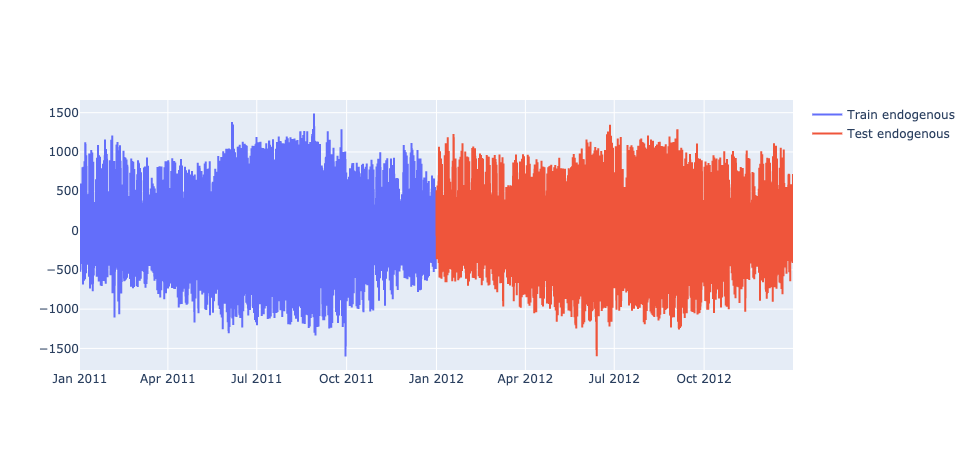

In [3]:
# show endogenous data
train_trace = go.Scatter(x=endogenous_train.index, y=endogenous_train, name='Train endogenous')
test_trace = go.Scatter(x=endogenous_test.index, y=endogenous_test, name='Test endogenous')
fig = go.Figure([train_trace, test_trace])
fig.show()

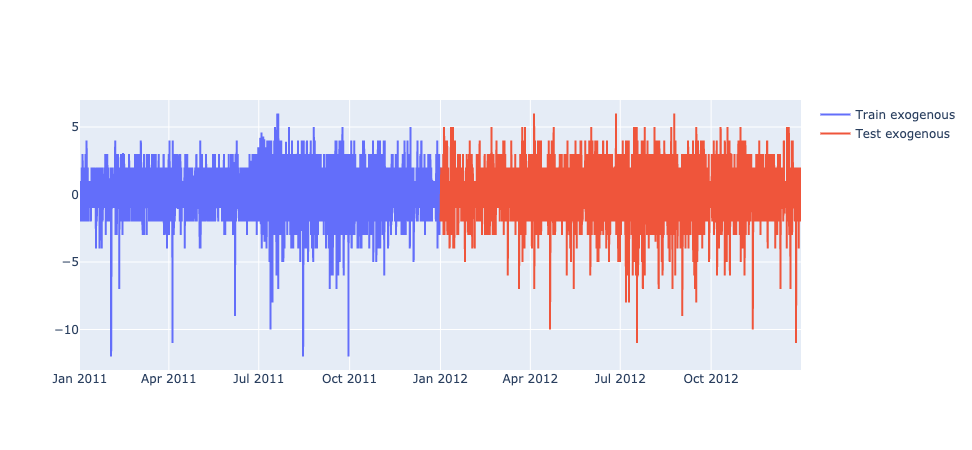

In [4]:
# show exogenous data
train_trace = go.Scatter(x=exogenous_train.index, y=exogenous_train['exogenous'], name='Train exogenous')
test_trace = go.Scatter(x=exogenous_test.index, y=exogenous_test['exogenous'], name='Test exogenous')
fig = go.Figure([train_trace, test_trace])
fig.show()

# 2. XGBoost & Linear Regression

In [8]:
# XGBoost default hyperparameters, train and predict
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror')
xg_reg.fit(exogenous_train, pd.DataFrame(data=endogenous_train))
xgb_preds = pd.Series(data=xg_reg.predict(exogenous_test), index=endogenous_test.index)

In [9]:
# XGBoost2 default hyperparameters, train and predict
xg_reg2 = xgb.XGBRegressor(objective ='reg:squarederror', tree_method='exact')
xg_reg2.fit(exogenous_train, pd.DataFrame(data=endogenous_train))
xgb_preds2 = pd.Series(data=xg_reg2.predict(exogenous_test), index=endogenous_test.index)

In [10]:
# Linear regression, train and predict
lreg = LinearRegression().fit(exogenous_train, endogenous_train)
lreg_preds = pd.Series(data=lreg.predict(exogenous_test), index=endogenous_test.index)

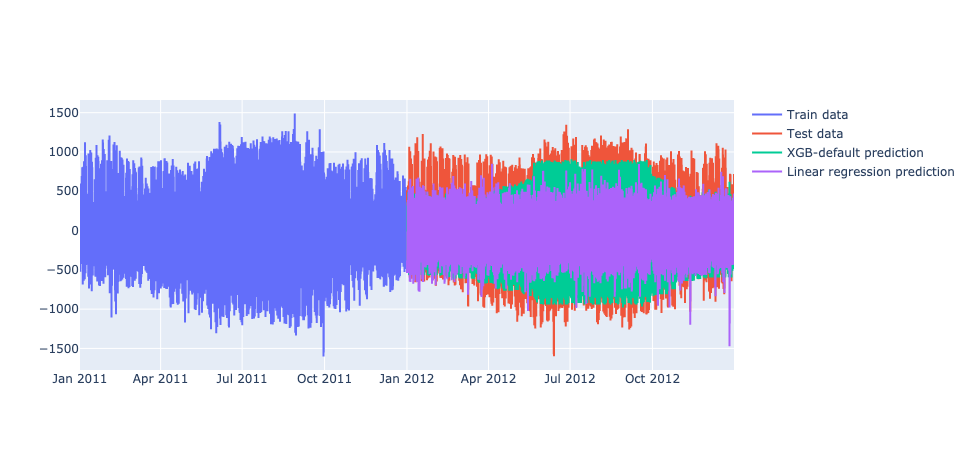

In [11]:
# Show predictions
train_trace = go.Scatter(x=endogenous_train.index, y=endogenous_train, name='Train data')
test_trace = go.Scatter(x=endogenous_test.index, y=endogenous_test, name='Test data')
xgb_pred_trace = go.Scatter(x=xgb_preds.index, y=xgb_preds, name='XGB-default prediction')
lreg_pred_trace = go.Scatter(x=lreg_preds.index, y=lreg_preds, name='Linear regression prediction')
fig = go.Figure([train_trace, test_trace, xgb_pred_trace, lreg_pred_trace])
fig.show()

Todo:
- separate training and test endogenous - Done
- (change prediction and test to dots) - Done
- add difference dbl arrows

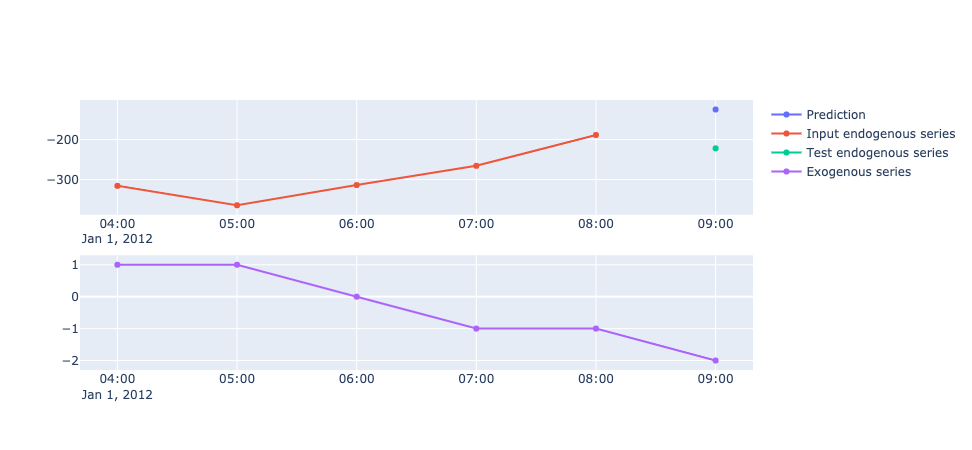

In [12]:
# Show predictions

fig = make_subplots(rows=2, cols=1)
shift_timestep = 8
start = -5
end = 1
fig.add_trace(
    go.Scatter(x=xgb_preds.index[shift_timestep:end+shift_timestep], y=xgb_preds[shift_timestep:end+shift_timestep], name='Prediction'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=endogenous_df.index[8760+start+shift_timestep:8760+shift_timestep], y=endogenous_df[shift_timestep+8760+start:8760+shift_timestep], name='Input endogenous series'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=endogenous_df.index[8760+shift_timestep:8760+end+shift_timestep], y=endogenous_df[8760+shift_timestep:8760+end+shift_timestep], name='Test endogenous series'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=exogenous_df.index[8760+start+shift_timestep:8760+end+shift_timestep], y=exogenous_df['exogenous'][8760+start:8760+end+shift_timestep], name='Exogenous series'),
    row=2, col=1
)
# fig.add_trace(
#     go.Scatter(x=[xgb_preds.index[0],xgb_preds.index[0]], y=[1200,-1000], mode='lines', showlegend=False),
#     row=1, col=1
# )

fig.show()

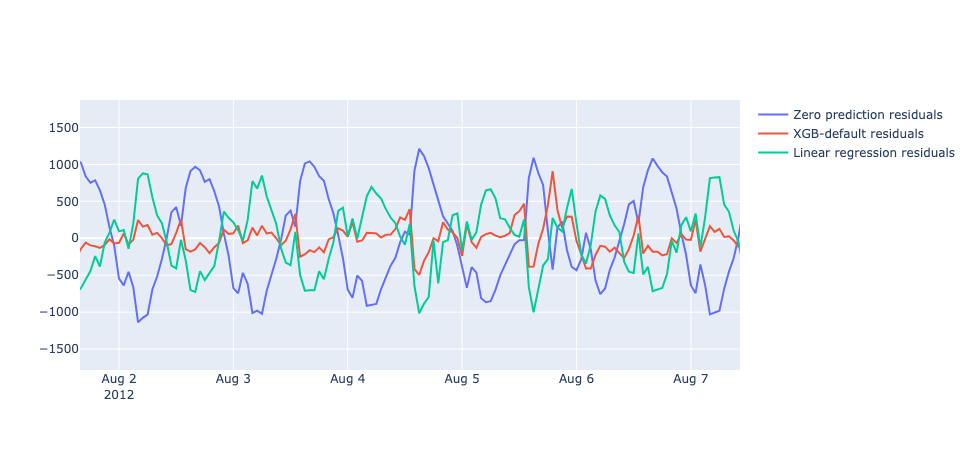

In [12]:
# show residuals
xgb_residuals = xgb_preds-endogenous_test
lreg_residuals = lreg_preds-endogenous_test
test_trace = go.Scatter(x=endogenous_test.index, y=endogenous_test, name='Zero prediction residuals')
xgb_res_trace = go.Scatter(x=endogenous_test.index, y=xgb_residuals, name='XGB-default residuals')
lreg_res_trace = go.Scatter(x=endogenous_test.index, y=lreg_residuals, name='Linear regression residuals')
fig = go.Figure([test_trace, xgb_res_trace, lreg_res_trace])
fig.show()

In [9]:
# Compare performance, measured in mean absolute error
print('Linear regression MAE: ' + str(mean_absolute_error(lreg_preds, endogenous_test)))
print('XGB-default MAE: ' + str(mean_absolute_error(xgb_preds, endogenous_test)))
print('Zero prediction MAE: ' + str(mean_absolute_error(endogenous_test, pd.Series(data=np.zeros(len(endogenous_test)), index=endogenous_test.index))))

Linear regression MAE: 317.6054495222263
XGB-default MAE: 150.853200377163
Zero prediction MAE: 385.8120195340451


# 3. Hyperparameter optimization XGBoost with Bayesian optimization

Note: in the thesis experiment I added another crossvalidation dataset, in order to prevent overfitting on the test data during hyperparameter optimization

In [3]:
# objective function and search space for Bayesian optimization

def objective(params):
    
    # instantiate model with hyperparameters
    xg_reg = xgb.XGBRegressor(
        objective ='reg:squarederror',
        max_depth=int(params['max_depth']),
        learning_rate=params['learning_rate'],
        n_estimators=int(params['n_estimators']),
        min_child_weight=params['min_child_weight'],
        subsample=params['subsample']
    )
    
    # fit the model
    xg_reg.fit(exogenous_train,pd.DataFrame(data=endogenous_train, index=endogenous_train.index))
    
    # make predictions
    xgb_preds = pd.Series(data=xg_reg.predict(exogenous_test), index=endogenous_test.index)

    # performance metric
    result = mean_absolute_error(xgb_preds, endogenous_test)

    return {'loss': result, 'status': STATUS_OK}
search_space = {
    'n_estimators': hp.quniform('n_estimators', 100, 800, 1),
    'max_depth':  hp.quniform('max_depth', 5, 20, 1),
    'min_child_weight': hp.quniform('min_child_weight', 5, 40, 1),
    'subsample': hp.quniform('subsample', 0.5, 1, 0.05),
    'learning_rate': hp.loguniform('learning_rate', -2.5, -0.5),
}
trials = Trials()

In [4]:
# Perform Bayesian optimization to find optimal hyperparameters
best = fmin(
    fn = objective,
    space = search_space,
    algo=tpe.suggest,
    max_evals = 50,
    trials=trials
)

100%|██████████| 50/50 [04:27<00:00,  5.36s/it, best loss: 119.54509645975669]


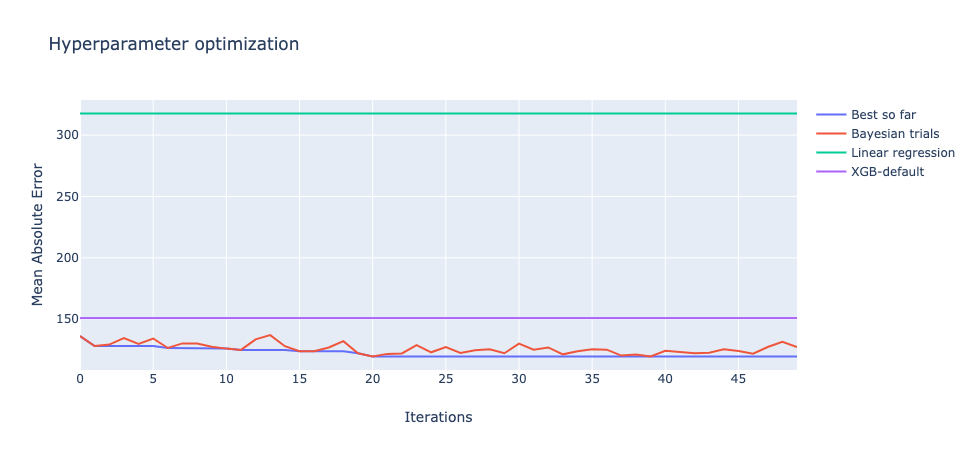

In [13]:
# Visualize Bayesian optimization process
perf_list = [trial['result']['loss'] for trial in trials.trials]
pending_min = [np.amin(perf_list[:i+1]) for i in range(len(perf_list))]
lreg_trace = go.Scatter(y=np.ones(len(perf_list))*mean_absolute_error(lreg_preds, endogenous_test), name='Linear regression')
xgb_trace = go.Scatter(y=np.ones(len(perf_list))*mean_absolute_error(xgb_preds, endogenous_test), name='XGB-default')
best_trace = go.Scatter(y=pending_min, name='Best so far')
bay_trace = go.Scatter(y=perf_list, name='Bayesian trials')
fig = go.Figure([best_trace, bay_trace, lreg_trace, xgb_trace])
fig.update_layout(title='Hyperparameter optimization',xaxis=go.layout.XAxis(title='Iterations'),yaxis=go.layout.YAxis(title="Mean Absolute Error"))
fig.show()

# 4. Experiment definition

### What's the problem? Computational complexity
- More features, feature selection
- Feature transformation selection
- Model selection + sequential option selection

### Definition of this research

##### What data is relevant?
- endogenous ánd exogenous
- large datasets
- one-step-ahead MAE

##### What forecasting models are promising?
- XGBoost (+ time based features) -> very fast
- 2 data transformations: differencing and SARIMA (long lengths of Exponential Smoothing not computationally possible) -> prestationarized

##### Which data?
- 8 sources
- 2 sizes (1 or 2 years of hourly data)
- 2 transformations
- that's 32 datasets in total

### Computational complexity estimation of testing 1 search algorithm (days) - duplicates, n_datasets

In [16]:
train_test_time = 20 # seconds
number_search_iterations = 100 # iterations
duplicates = 10 # to cope with stochasticity of search algorithms
n_datasets = 32 # to crossvalidate the search algorithm on multiple datasets
train_test_time*number_search_iterations*duplicates*n_datasets/60/60/24 # days

7.407407407407407

### Solution: result recycling, compute all MAE's of a predefined grid of configurations, use results as lookup table
This is only to prove in experimental setting that the algorithm works. I'll leave the (big amount of) nittygritty stuff in this step to when you read the thesis.

# 5. Warmstarted Bayesian optimization

In [3]:
from src.experimenting.hopt_experiment import HoptExperiment
from src.pipeline_optimization.bayesian_hopt import BayesianHopt
from src.pipeline_optimization.bayesian_hopt import Config
from src.utils.thesis_utils import thesis_lookup_objective, thesis_search_space, get_standard_dataset
from src.metalearning.metadata import MetaDataset
from src.metalearning.warmstarter import Warmstarter
import pickle

### On one dataset -> super speed

In [36]:
# parameters for Bayesian optimization
max_evals = 100

# constant inputs
objective = thesis_lookup_objective('COAST_diff_8760')
search_space = thesis_search_space()

# random search & bayesian optimization
naive = BayesianHopt(
    identifier='Naive Bayesian optimization',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals
)

naive.run_bayesian_hopt()

100%|██████████| 100/100 [00:12<00:00,  8.18it/s, best loss: 118.7952834515248]


results                                 configs                \
          loss status   walltime    crossval num_trees learning_rate   
0   145.507279     ok  19.333621  151.988597     520.0      0.189574   
1   213.970671     ok   4.889046  222.824777     240.0      0.008799   
2   127.620872     ok  25.865968  130.999929     660.0      0.113646   
3   209.076816     ok   7.773743  216.964633     240.0      0.068129   
4   293.081116     ok   1.006803  304.444363     100.0      0.113646   
..         ...    ...        ...         ...       ...           ...   
95  289.978643     ok   2.101221  300.175176     100.0      0.014678   
96  125.530860     ok  23.220623  129.490090     800.0      0.005275   
97  137.424078     ok  24.312206  140.643111     520.0      0.008799   
98  119.457375     ok  30.584166  122.067868     800.0      0.003162   
99  208.486292     ok  11.238816  215.681767     240.0      0.008799   

                                         
   max_depth min_child_weight subsample  
0       14.0             40.0      0.50  
1        7.0              5.0      1.00  
2       11.0             40.0      0.75  
3        9.0             22.5      0.75  
4        7.0             22.5      0.50  
..       ...              ...       ...  
95      11.0              5.0      1.00  
96       7.0             22.5      0.75  
97      14.0             22.5      0.75  
98       9.0             22.5      0.75  
99      14.0              5.0      0.50  

[100 rows x 9 columns]

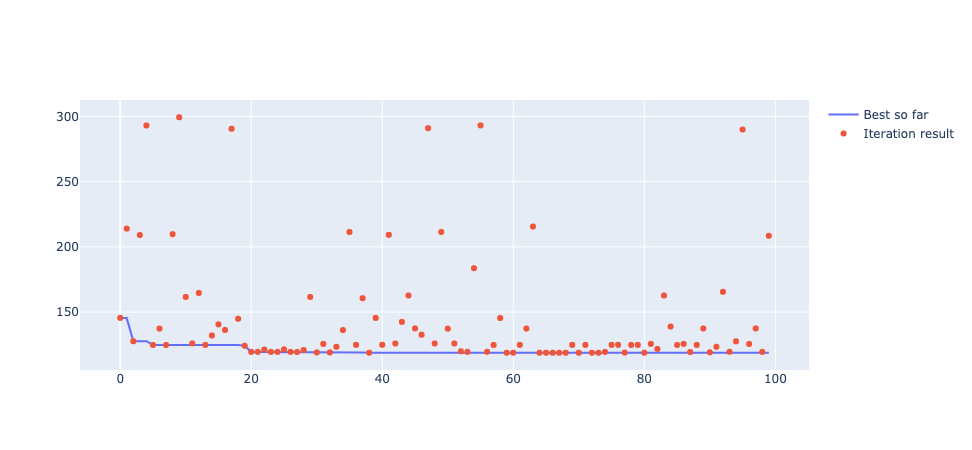

In [37]:
naive.visualize_search_performance(all_losses=True)

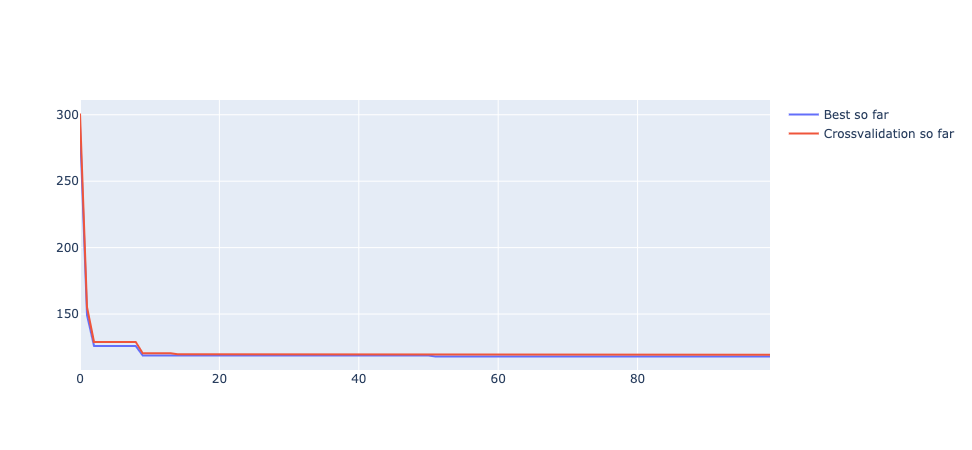

In [35]:
naive.visualize_search_performance(crossvalidation=True)

### Time to beat state of the art: warmstarting compared with naive Bayesian optimization

Target time series: 100%|██████████| 32/32 [2:06:12<00:00, 236.63s/it]  


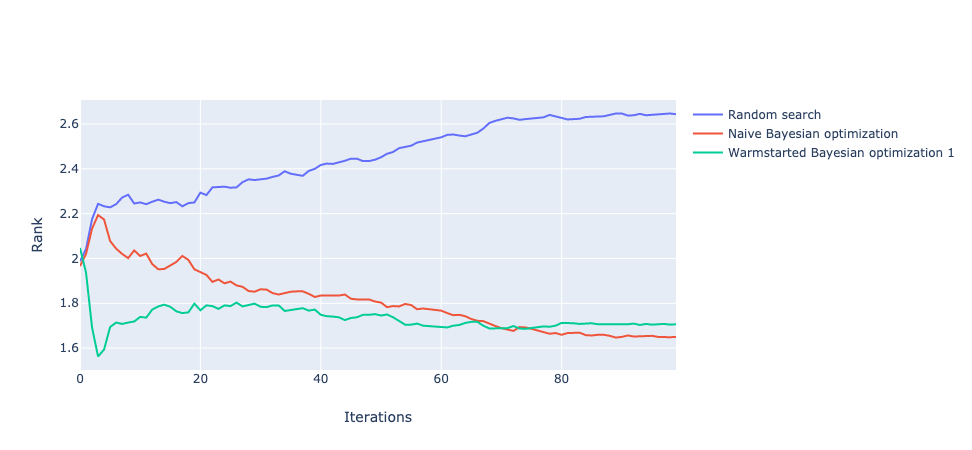

In [5]:
max_evals = 100
duplicates = 10
n_init_configs = 5
dataset_names = !ls ../../data/metadata/interim

### Fixed parts of the experiment

# Initialize metadataset and calculate metafeatures
metadataset_sample_names = !ls ../../data/metadata/interim
metasamples = [pickle.load(open('../../data/metadata/interim/' + sample_name,"rb")) for sample_name in metadataset_sample_names]
metadataset = MetaDataset(metasamples)

# Experiment
objective = thesis_lookup_objective
search_space = thesis_search_space()
target_ids = [metasample.identifier for metasample in metadataset.metasamples]

# initialize searches
rand = BayesianHopt(
    identifier='Random search',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    nr_random_starts=max_evals
)
naive = BayesianHopt(
    identifier='Naive Bayesian optimization',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    nr_random_starts=n_init_configs
)
warm = BayesianHopt(
    identifier='Warmstarted Bayesian optimization 1',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    warmstarter=Warmstarter(metadataset, n_init_configs=n_init_configs, n_sim_samples=1, n_best_per_sample=n_init_configs)
)
hopt_exp = HoptExperiment(
    hopts=[rand, naive, warm],
    duplicates=duplicates,
    objective=objective,
    metadataset=metadataset
)

hopt_exp.run_hopt_experiment(target_ids)

hopt_exp.visualize_avg_ranks()

### Is this sufficient? Separate 2 causes high performance -> compare with overall warmstart

Target time series: 100%|██████████| 32/32 [1:10:01<00:00, 131.31s/it]


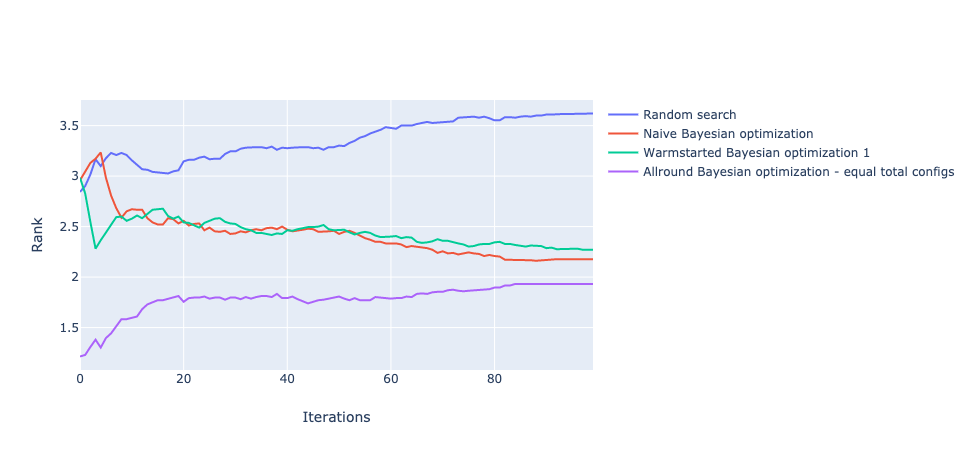

In [3]:
max_evals = 100
duplicates = 3
n_init_configs = 5
dataset_names = !ls ../../data/metadata/interim

### Fixed parts of the experiment

# Initialize metadataset and calculate metafeatures
metadataset_sample_names = !ls ../../data/metadata/interim
metasamples = [pickle.load(open('../../data/metadata/interim/' + sample_name,"rb")) for sample_name in metadataset_sample_names]
metadataset = MetaDataset(metasamples)

# Experiment
objective = thesis_lookup_objective
search_space = thesis_search_space()
target_ids = [metasample.identifier for metasample in metadataset.metasamples]

# initialize searches
rand = BayesianHopt(
    identifier='Random search',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    nr_random_starts=max_evals
)
naive = BayesianHopt(
    identifier='Naive Bayesian optimization',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    nr_random_starts=n_init_configs
)
warm = BayesianHopt(
    identifier='Warmstarted Bayesian optimization 1',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    warmstarter=Warmstarter(metadataset, n_init_configs=n_init_configs, n_sim_samples=1, n_best_per_sample=n_init_configs)
)
warm32 = BayesianHopt(
    identifier='Allround Bayesian optimization - equal total configs',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    warmstarter=Warmstarter(metadataset, n_init_configs=n_init_configs, n_sim_samples=32, n_best_per_sample=int(n_init_configs/32*100))
)
hopt_exp = HoptExperiment(
    hopts=[rand, naive, warm, warm32],
    duplicates=duplicates,
    objective=objective,
    metadataset=metadataset
)

hopt_exp.run_hopt_experiment(target_ids)

hopt_exp.visualize_avg_ranks()

### Best of both worlds, compare with coldstart

In [15]:
objective = thesis_lookup_objective
search_space = thesis_search_space()
target_ids = [metasample.identifier for metasample in metadataset.metasamples]

# initialize searches
rand = BayesianHopt(
    identifier='Random search',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    nr_random_starts=max_evals
)
naive = BayesianHopt(
    identifier='Naive Bayesian optimization',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    nr_random_starts=n_init_configs
)
warm = BayesianHopt(
    identifier='Warmstarted Bayesian optimization 5',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    warmstarter=Warmstarter(metadataset, n_init_configs=n_init_configs, n_sim_samples=5, n_best_per_sample=n_init_configs)
)
cold = BayesianHopt(
    identifier='Coldstarted Bayesian optimization 5',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    warmstarter=Warmstarter(metadataset, n_init_configs=n_init_configs, n_sim_samples=5, n_best_per_sample=n_init_configs, cold=True)
)
hopt_exp = HoptExperiment(
    hopts=[rand, naive, warm, cold],
    duplicates=duplicates,
    objective=objective,
    metadataset=metadataset
)

In [ ]:
hopt_exp.run_hopt_experiment(target_ids)

Target time series:  59%|█████▉    | 19/32 [3:04:16<1:43:02, 475.58s/it] 

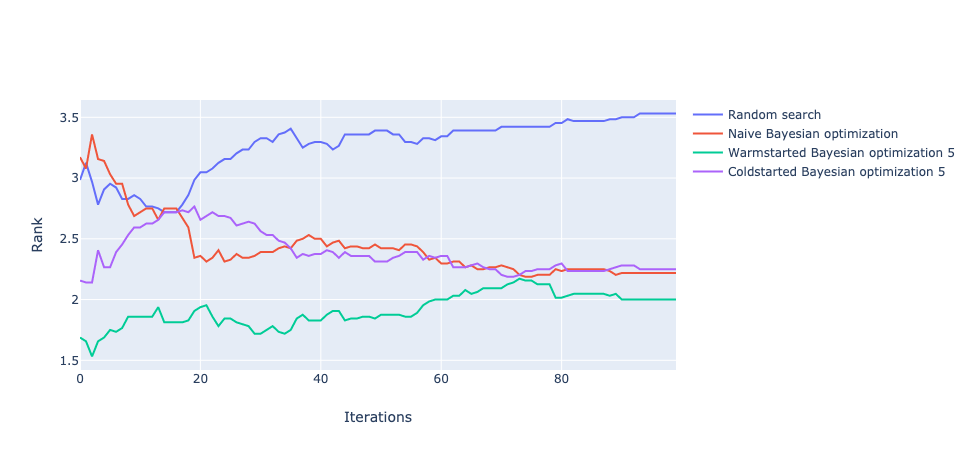

In [6]:
hopt_exp.visualize_avg_ranks()

In [5]:
max_evals = 100
duplicates = 1
n_init_configs = 5
dataset_names = !ls ../../data/metadata/interim

# Initialize metadataset and calculate metafeatures
metadataset_sample_names = !ls ../../data/metadata/interim
metasamples = [pickle.load(open('../../data/metadata/interim/' + sample_name,"rb")) for sample_name in metadataset_sample_names]
metadataset = MetaDataset(metasamples)

objective = thesis_lookup_objective
search_space = thesis_search_space()
target_ids = [metasample.identifier for metasample in metadataset.metasamples]

# initialize searches
rand = BayesianHopt(
    identifier='Random search',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    nr_random_starts=max_evals
)
naive = BayesianHopt(
    identifier='Naive Bayesian optimization',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    nr_random_starts=n_init_configs
)
warm = BayesianHopt(
    identifier='Warmstarted Bayesian optimization 5',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    warmstarter=Warmstarter(metadataset, n_init_configs=n_init_configs, n_sim_samples=5, n_best_per_sample=n_init_configs)
)
cold = BayesianHopt(
    identifier='Coldstarted Bayesian optimization 5',
    search_space=search_space,
    objective=objective,
    max_evals=max_evals,
    warmstarter=Warmstarter(metadataset, n_init_configs=n_init_configs, n_sim_samples=5, n_best_per_sample=n_init_configs, cold=True)
)
hopt_exp = HoptExperiment(
    hopts=[rand, naive, warm, cold],
    duplicates=duplicates,
    objective=objective,
    metadataset=metadataset
)

Calculate metafeatures of metasamples: 100%|██████████| 32/32 [00:00<00:00, 109.05it/s]


In [6]:
hopt_exp.run_hopt_experiment(target_ids)

Target time series: 100%|██████████| 32/32 [17:32<00:00, 32.88s/it]


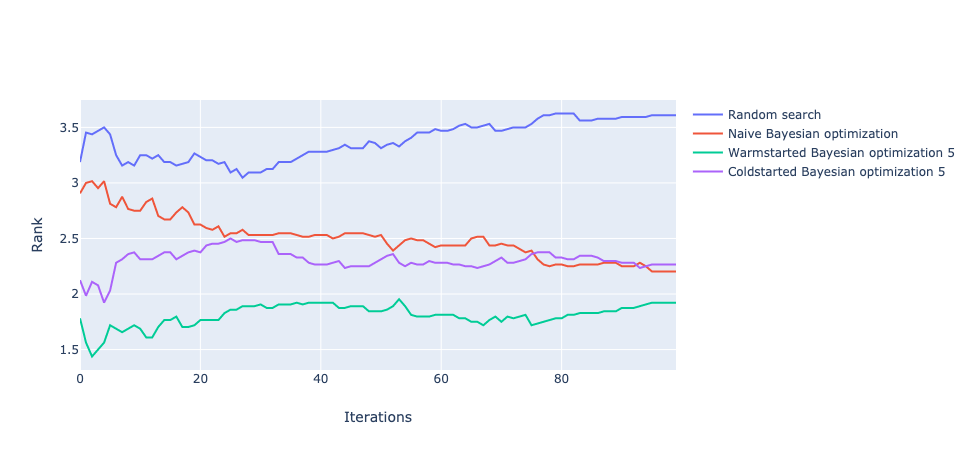

In [7]:
hopt_exp.visualize_avg_ranks()

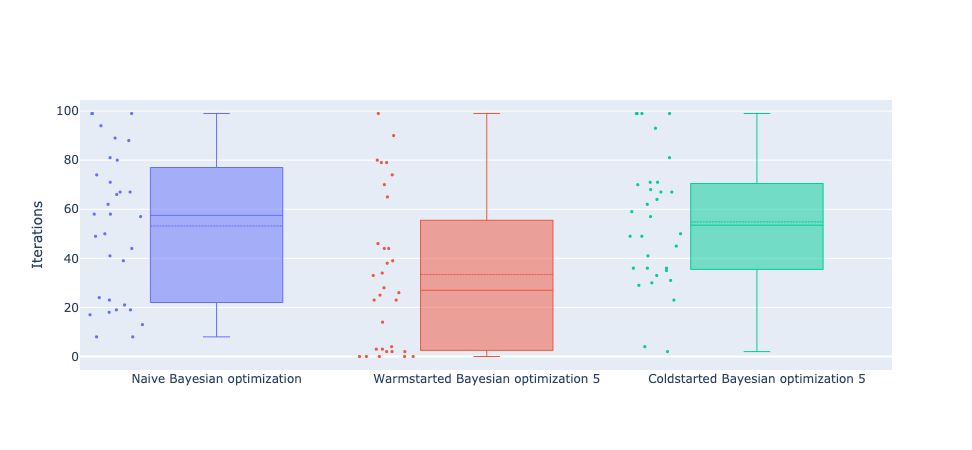

In [7]:
hopt_exp.visualize_walltime_comparison('Random search', 100)

### Extensions
The ground work was defining a grid for the lookup table and making implementation for getting those results. Next to that building the metalearning library was the biggest task. Now all that has been done, there is a experimental fundament to iterate on, the following aspects could be added:
- Upgrade metafeatures (hard, because we have very few datasets)
- Compare warmstarted Bayesian optimization with genetic optimization
- Introduce walltime in the cost function (only for genetic optimization probably)

# Fun facts
- The results would be even better when (as in reality) the search space is bigger
- Running the final experiment took a bit more than 2 hours, whereas without result recycling it would have taken a month
- the research is 100% reproducible by importing the library on Github
- the library is the first step towards an AutoML for forecasting, which can be achieved by including feature selection, transformation and model selection.

# Conclusion
It is possible to learn how to tune hyperparameters of forecasting models, by looking at previous forecasting tasks.

Notes Peyman:
- end of November or end of January (2 weeks send before, final report nov 4th (Peyman needs 5/6 days))
- send mail how many committee members
- 2:30 

# 4. Warmstarted Bayesian optimization

In [33]:
# Get optimal hyperparameter settings of similar dataset and set them as warmstart configurations

sim_df = pd.read_csv('../../data/metadata/raw/WEST_diff_8760.csv', index_col=0, header=[1])
sorted_df = sim_df.sort_values(by=['mae'])
configs = []
for i in range(2):
    config = sorted_df.iloc[i][['max_depth','learning_rate','num_trees','min_child_weight','subsample']].to_dict()
    config['n_estimators'] = config.pop('num_trees')
    print(config)
    configs.append(config)
    
warmstart_trials = warmstart(configs)

{'max_depth': 9.0, 'learning_rate': 0.008799225435691074, 'min_child_weight': 5.0, 'subsample': 0.5, 'n_estimators': 380.0}
{'max_depth': 9.0, 'learning_rate': 0.014677992676220691, 'min_child_weight': 5.0, 'subsample': 0.5, 'n_estimators': 240.0}


### Perform warmstarted Bayesian optimization

In [34]:
max_evals = 100
best = fmin(
    fn = objective,
    space = search_space,
    algo=tpe.suggest,
    max_evals = max_evals-len(configs),
    trials=warmstart_trials
)

100%|██████████| 100/100 [07:47<00:00,  4.67s/it, best loss: 115.34170564691247]


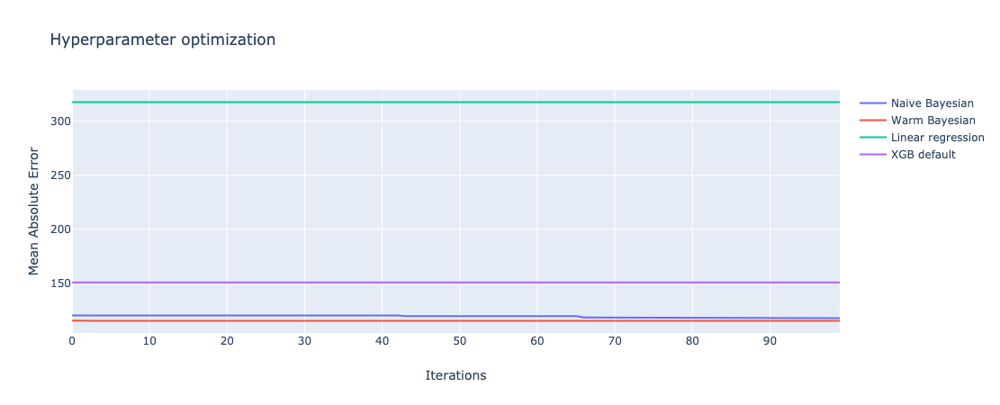

In [36]:
# Show Bayesian optimization results

naive_perf_list = [trial['result']['loss'] for trial in trials.trials]
naive_pending_min = [np.amin(naive_perf_list[:i+1]) for i in range(len(naive_perf_list))]
warm_perf_list = [trial['result']['loss'] for trial in warmstart_trials.trials]
warm_pending_min = [np.amin(warm_perf_list[:i+1]) for i in range(len(warm_perf_list))]

lreg_trace = go.Scatter(y=np.ones(len(warm_perf_list))*mean_absolute_error(lreg_preds, endogenous_test), name='Linear regression')
xgb_trace = go.Scatter(y=np.ones(len(warm_perf_list))*mean_absolute_error(xgb_preds, endogenous_test), name='XGB default')
naive_trace = go.Scatter(y=naive_pending_min, name='Naive Bayesian')
warm_trace = go.Scatter(y=warm_pending_min, name='Warm Bayesian')
fig = go.Figure([naive_trace, warm_trace, lreg_trace, xgb_trace])
fig.update_layout(title='Hyperparameter optimization',xaxis=go.layout.XAxis(title='Iterations'),yaxis=go.layout.YAxis(title="Mean Absolute Error"))
fig.show()